In [1]:
%matplotlib inline
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
import numpy as np
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from IPython.display import HTML

/Users/kaftand/anaconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)
/Users/kaftand/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
normalDist = lambda x : (1.0/(0.5*np.sqrt(2*np.pi)))*np.exp(-(x**2)/(2*0.5*0.5));
normalDistIn = lambda x : (1.0/(0.25*np.sqrt(2*np.pi)))*np.exp(-(x**2)/(2*0.25*0.25));
uniformDist = lambda x : 1.0*(x>-1)/2.0 - 1.0*(x > 1)/2.0

A research group I was in asked me to demonstrate how to GANs worked. I put together this presentation and have modified it to be more "stand alone". The basic idea behind GANs is that you train two models against each other. The first (called the generator) tries to generate samples that the second model (called the discriminator) is unable to distinguish from a known distribution. More details: The first GAN paper is really well written and can be found [here] (http://papers.nips.cc/paper/5423-generative-adversarial-nets.pdf). Most of the really cool research on GANs deal with pictures, but I have a 8gb, 2 core macbook - I only have the capacity for a more simple demo. So in this demo, we are going to train our generator to try generating samples from a normal distribution, and train our discriminator to distinguish between our generator and samples from a true normal distribution.

We start with our generator, three layer nn

In [3]:
Generator = Sequential();
Generator.add(Dense(30, activation = "tanh", batch_input_shape = [None, 1], name= "Generator1", use_bias=False));
Generator.add(Dense(10, name= "Generator2", activation = "tanh", use_bias=False));
Generator.add(Dense(1, name= "Generator3",activation = "linear", use_bias=False));
Generator.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Generator1 (Dense)           (None, 30)                30        
_________________________________________________________________
Generator2 (Dense)           (None, 10)                300       
_________________________________________________________________
Generator3 (Dense)           (None, 1)                 10        
Total params: 340
Trainable params: 340
Non-trainable params: 0
_________________________________________________________________


Discriminator, two layer nn

In [4]:
Discriminator = Sequential();
Discriminator.add(Dense(30, activation = "tanh", batch_input_shape = [None, 1], name= "Discriminator1"));
Discriminator.add(Dense(1, activation = "tanh", name= "Discriminator2"));
Discriminator.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Discriminator1 (Dense)       (None, 30)                60        
_________________________________________________________________
Discriminator2 (Dense)       (None, 1)                 31        
Total params: 91
Trainable params: 91
Non-trainable params: 0
_________________________________________________________________


To train the generator, we need to merge the discriminator with the generator. Then we can back propagate the success of the discriminator to train the generator.

In [6]:
opt = RMSprop(lr=0.0001)
#opt = SGD(lr=0.0001)
Generator.compile(optimizer = opt, loss = 'binary_crossentropy')
Discriminator.compile(optimizer = opt, loss = 'binary_crossentropy')
GAN = Sequential();
GAN.add(Generator);
make_trainable(Discriminator, False);
GAN.add(Discriminator);
GAN.compile(optimizer = opt, loss = 'binary_crossentropy')
GAN.summary();
Discriminator.summary()
Generator.summary()


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential (Sequential)      (None, 1)                 340       
_________________________________________________________________
sequential_1 (Sequential)    (None, 1)                 91        
Total params: 431
Trainable params: 340
Non-trainable params: 91
_________________________________________________________________
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Discriminator1 (Dense)       (None, 30)                60        
_________________________________________________________________
Discriminator2 (Dense)       (None, 1)                 31        
Total params: 182
Trainable params: 91
Non-trainable params: 91
_________________________________________________________________
_________________________________________________________________
Layer (type) 

One of the problems I had when programming this is making sure that the discriminator does not update its weights during the training of the generator. I printed the weights before and after training each step of the discriminator to make sure the code is working as intended. I recommend this as a debug step

In [7]:
xGAN = np.random.uniform(low=-1, high = 1, size=(10));
yGAN = np.array([1.0]*10);
print("Before GAN Train")
print(Discriminator.layers[0].get_weights())
GAN.train_on_batch(xGAN, yGAN);
print("After GAN Train")
print(Discriminator.layers[0].get_weights())
xGAN = np.random.uniform(low=-1, high = 1, size=(5));
yHat = Generator.predict(xGAN).reshape(5);
yDis = np.concatenate((np.random.normal(scale = 0.25, size=(5)), yHat));
tDis = np.concatenate(([1.0]*5, [0.0]*5));
print("Before Dis Train")
make_trainable(Discriminator, True);
print(Discriminator.layers[0].get_weights())
Discriminator.train_on_batch(yDis, tDis)
make_trainable(Discriminator, False);
print("After Dis Train")
print(Discriminator.layers[0].get_weights())

Before GAN Train
[array([[ 0.07790834,  0.33251095,  0.11585385,  0.278086  , -0.17744294,
         0.14913195,  0.19995344,  0.1272453 , -0.38550115,  0.03861061,
         0.39579105,  0.25981593, -0.3661361 , -0.09021187,  0.18493873,
        -0.1502145 ,  0.42752695, -0.0421496 , -0.2951402 , -0.08641788,
         0.31885487,  0.29115736,  0.24426085,  0.1770531 , -0.33699897,
        -0.01080704, -0.18449599,  0.05670163, -0.02358907, -0.25167644]],
      dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32)]
After GAN Train
[array([[ 0.07790834,  0.33251095,  0.11585385,  0.278086  , -0.17744294,
         0.14913195,  0.19995344,  0.1272453 , -0.38550115,  0.03861061,
         0.39579105,  0.25981593, -0.3661361 , -0.09021187,  0.18493873,
        -0.1502145 ,  0.42752695, -0.0421496 , -0.2951402 , -0.08641788,
         0.31885487,  0.29115736,  0.24426085,  0.1770531 , 

We need to input something into the generator. So to make things simple, we are going to input a normal distribution with a different scale than the true distribution we are trying to model. Yes - this calculation is pretty arbitrary, but it still demonstrates how GANs work.

Text(0.5,1,'output')

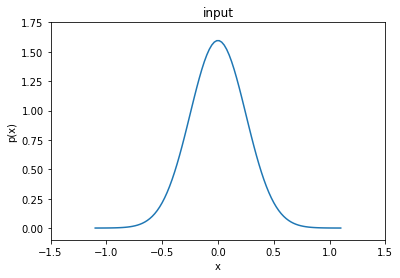

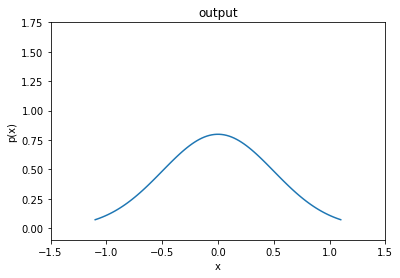

In [8]:
x2plot = np.linspace(-1.1,1.1,100)
plt.plot(x2plot,normalDistIn(x2plot))
plt.xlim((-1.5, 1.5))
plt.ylim((-0.1, 1.75))
plt.title("input")
plt.xlabel("x")
plt.ylabel("p(x)")
plt.figure()
plt.plot(x2plot,normalDist(x2plot))
plt.xlim((-1.5, 1.5))
plt.ylim((-0.1, 1.75))
plt.xlabel("x")
plt.ylabel("p(x)")
plt.title("output")

**Can we find the function that transforms N(0,0.25) to N(0,0.5) ?**

In [16]:
def trainNetwork(desToGenRatio):
    Discriminator = Sequential();
    Discriminator.add(Dense(30, activation = "tanh", batch_input_shape = [None, 1], name= "Discriminator1"));
    Discriminator.add(Dense(1, activation = "tanh", name= "Discriminator2"));
    Discriminator.summary()
    Generator = Sequential();
    Generator.add(Dense(30, activation = "tanh", batch_input_shape = [None, 1], name= "Generator1", use_bias=False));
    Generator.add(Dense(10, name= "Generator2", activation = "tanh", use_bias=False));
    Generator.add(Dense(1, name= "Generator3",activation = "linear", use_bias=False));
    Generator.summary()
    opt = RMSprop(lr=0.0001)
    #opt = SGD(lr=0.0001)
    Generator.compile(optimizer = opt, loss = 'binary_crossentropy')
    Discriminator.compile(optimizer = opt, loss = 'binary_crossentropy')
    GAN = Sequential();
    GAN.add(Generator);
    make_trainable(Discriminator, False);
    GAN.add(Discriminator);
    GAN.compile(optimizer = opt, loss = 'binary_crossentropy')
    fig, ax = plt.subplots(figsize=(5, 3))
    xs = []
    desY = []
    genY = []
    ims = []
    epochNum = []
    for iEpoch in range(10000):
        make_trainable(Discriminator, False);

        xGAN = np.random.normal(scale = 0.25, size=(10));
        yGAN = np.array([1.0]*10);
        GAN.train_on_batch(xGAN, yGAN);
        make_trainable(Discriminator, True);
        for i in range(desToGenRatio):
            xGAN = np.random.normal(scale = 0.25, size=(5));
            yHat = Generator.predict(xGAN).reshape(5);
            yDis = np.concatenate((np.random.normal(scale = 0.5, size=(5)), yHat));
            tDis = np.concatenate(([1.0]*5, [0.0]*5));
            yDisShuf, tDisShuf = shuffle(yDis, tDis)
            Discriminator.train_on_batch(yDisShuf, tDisShuf)
        if (iEpoch%20)==0:
            epochNum.append(str(iEpoch))
            ax.clear()
            xs.append(x2plot)
            desY.append (Discriminator.predict(x2plot).reshape(x2plot.shape[0]))
            genY.append (Generator.predict(np.random.normal(scale = 0.25, size=(1000))).reshape(1000))
            if (iEpoch == 0):
                desAx = ax.plot(x2plot,Discriminator.predict(x2plot).reshape(x2plot.shape[0]))
                targetAx = ax.plot(x2plot, normalDist(x2plot))
                histAx = ax.hist(Generator.predict(np.random.normal(scale = 0.25, size=(1000))).reshape(1000), density=1)
            else:
                ax.plot(x2plot,Discriminator.predict(x2plot).reshape(x2plot.shape[0]))
                ax.plot(x2plot, normalDist(x2plot))
                ax.hist(Generator.predict(np.random.normal(scale = 0.25, size=(1000))).reshape(1000), density=1)
            plt.show()
            ims.append(ax.get_children())
            #plt.hist(np.random.normal(scale = 0.25, size=(1000)), normed=1)
    return (fig, ax, xs, desY, genY)

In [22]:
from matplotlib.animation import FuncAnimation
def trainAndDisplayFig(desToGenRatio):
    fig, ax, xs, desY, genY = trainNetwork(desToGenRatio)

    def animate(i):
        ax.clear()
        ax.plot(xs[i],desY[i])
        ax.plot(xs[i], normalDist(xs[i]))
        ax.hist(genY[i], density=1)
        ax.set(xlim=(-2, 2), ylim=(0, 1))
        ax.set_title('Epoch ' + epochNum[i])

    ani = FuncAnimation(fig, animate, interval=50, frames=len(epochNum))
    return ani

In the below gif, the histogram represents samples from the generator. The orange curve shows the true distribution the samples are drawn from. The blue curve shows the probability that the discriminator thinks a certain output is fake.

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Discriminator1 (Dense)       (None, 30)                60        
_________________________________________________________________
Discriminator2 (Dense)       (None, 1)                 31        
Total params: 91
Trainable params: 91
Non-trainable params: 0
_________________________________________________________________
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Generator1 (Dense)           (None, 30)                30        
_________________________________________________________________
Generator2 (Dense)           (None, 10)                300       
_________________________________________________________________
Generator3 (Dense)           (None, 1)                 10        
Total params: 340
Trainable params: 340
Non-trainable params: 0
________________

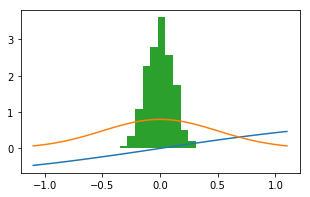

In [26]:
ani = trainAndDisplayFig(1)
HTML(ani.to_jshtml())

One of the hyper parameters for training is the amount you train the discriminator vs the generator. Goodfellow recommends training the discriminator more than the generator. In our first example, we trained them equally. Next, we train the discriminator 100x as much:

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Discriminator1 (Dense)       (None, 30)                60        
_________________________________________________________________
Discriminator2 (Dense)       (None, 1)                 31        
Total params: 91
Trainable params: 91
Non-trainable params: 0
_________________________________________________________________
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Generator1 (Dense)           (None, 30)                30        
_________________________________________________________________
Generator2 (Dense)           (None, 10)                300       
_________________________________________________________________
Generator3 (Dense)           (None, 1)                 10        
Total params: 340
Trainable params: 340
Non-trainable params: 0
________________

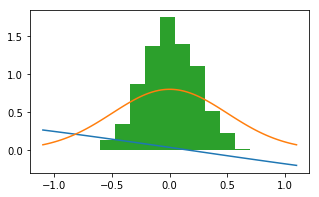

In [28]:
ani = trainAndDisplayFig(100)
HTML(ani.to_jshtml())

As we see, the generator starts creating much more reasonable samples much quicker.